# OPTIONAL Workbook for Final Project, Part 3

Your group is welcome to work on a local version of a notebook for this assignment.

This workspace is here if you'd rather not have to install all necessary packages locally.

You can download any json files to your local computer to add them to your local jekyll page.

To download, you can right-click on the file and hit download.  For example, with the following code:

```python
from vega_datasets import data
import altair as alt

source = data.cars()
source.rename(columns={"Miles_per_Gallon":"Miles per Gallon"}, 
              inplace=True)


chart = alt.Chart(source).mark_circle(size=60).encode(
    x='Horsepower',
    y='Miles per Gallon',
    color='Origin',
    tooltip=['Name', 'Origin', 'Horsepower', 'Miles per Gallon']
).interactive()

chart.properties(width='container').save("cars.json")
```

You can download from the side bar like this:

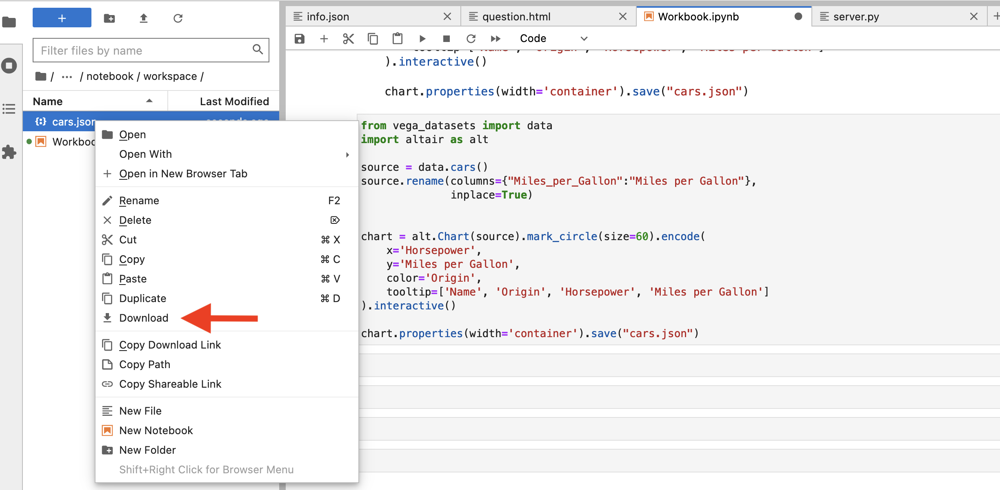

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt
import datetime
import geopandas as gpd
import contextily as ctx
import ipywidgets
import numpy as np

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-xbjou0tz because the default path (/tmp/cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
# Importing and manipulating datasets
df = pd.read_csv("https://data.bloomington.in.gov/api/views/9t63-jmjk/rows.csv?accessType=DOWNLOAD")
print(df.head())

df['date'] = pd.to_datetime(df['date'])
df = df.dropna(subset=['watt_hours', 'watt_hours_expected']).reset_index()
df['watt_above_exp'] = df['watt_hours'] - df['watt_hours_expected']
df = df[df['date'] >= "2018-01-01"].reset_index()
print(df.columns)

   site_id        date  watt_min  watt_max  watt_avg  watt_hours  \
0  3764455  01/01/2017       NaN       NaN       NaN         NaN   
1  3764455  01/02/2017       NaN       NaN       NaN         NaN   
2  3764455  01/03/2017       NaN       NaN       NaN         NaN   
3  3764455  01/04/2017       NaN       NaN       NaN         NaN   
4  3764455  01/05/2017       NaN       NaN       NaN         NaN   

   watt_hours_expected      site              address   latitude  longitude  \
0                  NaN  Banneker  930 West 7th Street  39.168883 -86.545038   
1                  NaN  Banneker  930 West 7th Street  39.168883 -86.545038   
2                  NaN  Banneker  930 West 7th Street  39.168883 -86.545038   
3                  NaN  Banneker  930 West 7th Street  39.168883 -86.545038   
4                  NaN  Banneker  930 West 7th Street  39.168883 -86.545038   

                department  
0  Bloomington Parks & Rec  
1  Bloomington Parks & Rec  
2  Bloomington Parks & Rec  


In [3]:
gdf_IN = gpd.read_file("Road_Centerlines_of_Bloomington_IN_Current.geojson")


In [4]:
print(gdf_IN.shape)
print(gdf_IN.head())
print(gdf_IN.columns)

(3225, 71)
   objectid  toaddr_l  toaddr_r  fromaddr_l  fromaddr_r  parity_l  parity_r  \
0    371389      1125      1124        1101        1100       NaN       NaN   
1    371574       199       198         101         100       NaN       NaN   
2    371688         0         0           0           0       NaN       NaN   
3    371789      2929      2930        2901        2900       NaN       NaN   
4    371970       399       398         301         300       NaN       NaN   

            st_full st_premod st_predir  ... geopretype     geostreetname  \
0         S NOTA DR       NaN     SOUTH  ...        NaN              NOTA   
1       E WILSON ST       NaN      EAST  ...        NaN            WILSON   
2  UNNAMED PROPOSED       NaN       NaN  ...        NaN  UNNAMED PROPOSED   
3     S MCINTIRE DR       NaN     SOUTH  ...        NaN          MCINTIRE   
4       E SMITH AVE       NaN      EAST  ...        NaN             SMITH   

  geosufdir geostreettype  geocityleft  geocityrigh

In [5]:
df_solar_dep_site_gb = df.groupby(by=['site', 'department'])[["latitude", "longitude", "watt_avg", "watt_max", "watt_above_exp"]].agg('mean').reset_index()
# df_solar_dep_site_gb['site_map_size'] = (df_solar_dep_site_gb['watt_max']/df_solar_dep_site_gb['watt_max'].max())
df_solar_site_count = df.groupby(by=['site', 'department']).agg("count").rename(columns={"date": "count"}).reset_index()[["count"]]
df_solar_dep_site_gb = pd.concat([df_solar_dep_site_gb, df_solar_site_count], axis=1)
# df_solar_dep_site_gb['bar_opacity'] = (df_solar_dep_site_gb['count']/(df_solar_dep_site_gb['count'].max()))
print(df_solar_dep_site_gb.sample(5))

                        site                department   latitude  longitude  \
19         Street Department  Bloomington Public Works  39.144640 -86.526946   
21     Twin Lakes Rec Center   Bloomington Parks & Rec  39.156350 -86.563258   
3                     Fire 1  Bloomington Public Works  39.164879 -86.530824   
9   Maintenance Building 345   Bloomington Parks & Rec  39.164651 -86.551031   
10  Maintenance Building 545   Bloomington Parks & Rec  39.161806 -86.549627   

        watt_avg       watt_max  watt_above_exp  count  
19   3006.849359   13209.833333    7.278542e+03    312  
21  47604.275510  248500.520833    1.178007e+06    174  
3    6428.951311   29996.977528    7.687343e+03    268  
9     896.037801    4225.690722    3.495412e+03    291  
10   3217.830619   15257.110749    9.758932e+03    307  


In [6]:
df_solar_dep_site_gb['count'].describe()

count      27.000000
mean      360.111111
std       328.614496
min        87.000000
25%       243.500000
50%       291.000000
75%       303.500000
max      1687.000000
Name: count, dtype: float64

In [7]:
interval = alt.selection_interval()

color = alt.condition(interval, alt.Color(field = 'department', legend = alt.Legend(orient='top', title = 'City Department')), alt.value('lightgray'))
size = alt.Size(bin=alt.BinParams(binned=True), field='watt_max', title = 'Site size (by watt_max)', legend = alt.Legend(orient='top', direction = alt.Orientation('horizontal')))

map_bg = alt.Chart(gdf_IN).mark_geoshape(
    stroke='black',
    fill='slategray',
    thickness=0.33,
    opacity=0.25
)

map_pts = alt.Chart(df_solar_dep_site_gb, title='Bloomington, IN Solar Sites').mark_point(filled=True).encode(
    longitude = alt.Longitude(field = 'longitude', type = 'quantitative', title = "Longitude"),
    latitude= alt.Latitude(field = 'latitude', type = 'quantitative', title = "Latitude"),
    color=color,
    size=size
).add_params(
    interval
)

bars = alt.Chart(df_solar_dep_site_gb, title = "Watt's produced relative to site's expected production").mark_bar().encode(
#     x='site:O',
    x = alt.X(field='site', type = 'ordinal', title = 'Site Name', axis = alt.Axis(labelAngle=40)),
#     y='watt_above_exp:Q',
    y = alt.Y(field='watt_above_exp', scale=alt.Scale(type='symlog'), type='quantitative', title='Watts Produced (0 = Expected Prod.)'),
    color = alt.condition(
        alt.datum.watt_above_exp > 0,
        alt.value("gold"),
        alt.value("slateblue")
        ),
    opacity = alt.Opacity(bin = True, field='count', title = 'Count of Producing Days', type='quantitative', legend = alt.Legend(orient='top'))
).transform_filter(
    interval
)

In [8]:
solar_map = alt.layer(map_bg, map_pts)
dash = alt.HConcatChart(hconcat=[solar_map, bars])
dashboard = dash.configure(background = "whitesmoke")

In [9]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [10]:
dashboard

alt.HConcatChart(...)

In [11]:
dashboard.save('FP3_Dashboard.json')

In [12]:
size2 = alt.Size(bin=alt.BinParams(binned=True), field='watt_max', title = 'Site size (by watt_max)', legend = alt.Legend(orient='bottom-right', direction = alt.Orientation('vertical')))

map_bg2 = alt.Chart(gdf_IN).mark_geoshape(
    stroke='black',
    fill='slategray',
    thickness=0.33,
    opacity=0.25
)

map_pts2 = alt.Chart(df_solar_dep_site_gb, title='Bloomington, IN Solar Sites').mark_point(filled=True).encode(
    longitude = alt.Longitude(field = 'longitude', type = 'quantitative', title = "Longitude"),
    latitude= alt.Latitude(field = 'latitude', type = 'quantitative', title = "Latitude"),
    color='department:N',
    shape='department:N',
    size='count:Q',
    tooltip=alt.Tooltip(field='site', title='Location')
)

solar_map2 = alt.layer(map_bg2, map_pts2)
solar_map2 = solar_map2.properties(
    width=750,
    height=500
).configure(
    background = "whitesmoke"
)
solar_map2

alt.LayerChart(...)

In [13]:
solar_map2.save('FP3_solar_map2.json')

In [14]:
bars2 = alt.Chart(df_solar_dep_site_gb, title = "Watt's produced relative to site's expected production").mark_bar().encode(
#     x='site:O',
    x = alt.X(field='site', type = 'ordinal', title = 'Site Name', axis = alt.Axis(labelAngle=40)),
#     y='watt_above_exp:Q',
    y = alt.Y(field='watt_above_exp', scale=alt.Scale(type='linear'), type='quantitative', title='Watts Produced (0 = Expected Prod.)'),
    color = alt.condition(
        alt.datum.watt_above_exp > 0,
        alt.value("gold"),
        alt.value("slateblue")
        ),
    opacity = alt.Opacity(bin = True, field='count', title = 'Count of Producing Days', type='quantitative', legend = alt.Legend(orient='right'))
)

bars2

alt.Chart(...)

In [15]:
bars3 = alt.Chart(df_solar_dep_site_gb, title = "Average Watts Produced").mark_bar().encode(
#     x='site:O',
    x = alt.X(field='site', type = 'ordinal', title = 'Site Name', axis = alt.Axis(labelAngle=40), sort='-y'),
#     y='watt_above_exp:Q',
    y = alt.Y(field='watt_avg', scale=alt.Scale(type='linear'), type='quantitative', title='Watts'),
    color = alt.Color(field='department', type='ordinal', title = 'City Department')
)

bars3

alt.Chart(...)

In [16]:
bars3.save("FP3_bars3.json")

In [17]:
df_scatter = df.copy()
df_scatter_gb = df_scatter.groupby(by=['site', 'date']).agg('mean').reset_index()

In [18]:
print(df_scatter_gb.head())
print(df_scatter_gb.shape)
print(df_scatter_gb.columns)

       site       date  level_0  index  site_id  watt_min  watt_max  watt_avg  \
0  Banneker 2018-02-28        0    423  3764455       NaN    5572.0    1893.0   
1  Banneker 2018-03-01        1    424  3764455       NaN    3228.0     875.0   
2  Banneker 2018-03-05        2    428  3764455       NaN    1195.0    1026.0   
3  Banneker 2018-03-06        3    429  3764455       NaN    6579.0    3818.0   
4  Banneker 2018-03-07        4    430  3764455       NaN   11108.0    5797.0   

   watt_hours  watt_hours_expected   latitude  longitude  watt_above_exp  
0      5111.0              37964.0  39.168883 -86.545038        -32853.0  
1      2193.0              64452.0  39.168883 -86.545038        -62259.0  
2       168.0              64452.0  39.168883 -86.545038        -64284.0  
3      3222.0              64452.0  39.168883 -86.545038        -61230.0  
4      3817.0              64452.0  39.168883 -86.545038        -60635.0  
(9723, 13)
Index(['site', 'date', 'level_0', 'index', 'site_id'

In [19]:
selection = alt.selection_point(fields=['site'])
color = alt.condition(selection, alt.Color('site:N').legend(None), alt.value('lightgray'))

scatter = alt.Chart(df_scatter_gb, title='Watts produced vs sites average').mark_point().encode(
    x=alt.X(field='watt_avg', title='Average Watt Hours', type='quantitative'),
    y=alt.Y(field = 'watt_hours', title = 'Watt Hours Produced', type='quantitative'),
    color=color,
    tooltip='date:T'
).transform_filter(
    selection
).properties(
    height=400
)

legend = alt.Chart(df_scatter_gb).mark_point(filled=True).encode(
    alt.Y('site:N').axis(orient='right'),
    color=color
).add_params(
    selection
).properties(
    height=400
)

scatter1 = alt.HConcatChart(hconcat=[scatter, legend])
scatter1

alt.HConcatChart(...)

In [20]:
scatter1.save("FP3_scatter1.json")